# Advanced Lane Line Finding

## Stage 0: Preperation

Import the useful libraries and read the test images.

In [1]:
#importing some useful packages
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2
%matplotlib inline

In [2]:
# test images loading
images=[mpimg.imread(img) for img in ["test_images/test%d.jpg"%i for i in range(1,7)]]

## Stage 1: Calibration

Use the set of chessboard images for camera calibration.

This process will return the distortion coeficients and then all images are calibrated.

In [3]:
# Todo: Get the imagepoints&objectpoints prepared for calibration

import glob
# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9, 0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')

presented=False

# Step through the list and search for chessboard corners
for idx, fname in enumerate(images):
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6), None)
    objpoints.append(objp)
    imgpoints.append(corners)


Nones and unmappings should be removed, else the "calibrateCamera" function would report an error.

In [4]:
# Get the nones and unmappings out from imgpoints
for i in range(len(imgpoints)-1,-1,-1):
    if imgpoints[i]==None or len(imgpoints[i])!=len(objpoints[i]):
        imgpoints.remove(imgpoints[i])
        objpoints.remove(objpoints[i])
        print(i)

14
0


/Users/jhsiao/anaconda/envs/py3/lib/python3.5/site-packages/ipykernel/__main__.py:3: FutureWarning: comparison to `None` will result in an elementwise object comparison in the future.
  app.launch_new_instance()
/Users/jhsiao/anaconda/envs/py3/lib/python3.5/site-packages/ipykernel/__main__.py:4: FutureWarning: comparison to `None` will result in an elementwise object comparison in the future.
/Users/jhsiao/anaconda/envs/py3/lib/python3.5/site-packages/ipykernel/__main__.py:4: DeprecationWarning: elementwise == comparison failed; this will raise an error in the future.


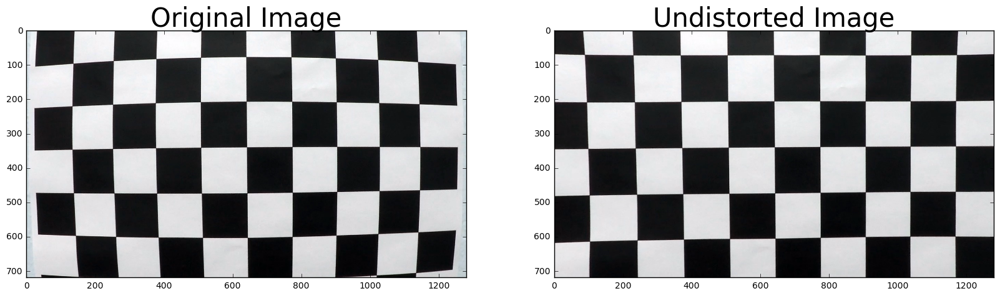

In [5]:
# Compute the calibration matrix and distortion coeficients from given images
# And test the result
test_image=cv2.imread("camera_cal/calibration1.jpg")
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1],None,None)
dst = cv2.undistort(test_image, mtx, dist, None, mtx)
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(test_image)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(dst)
ax2.set_title('Undistorted Image', fontsize=30)

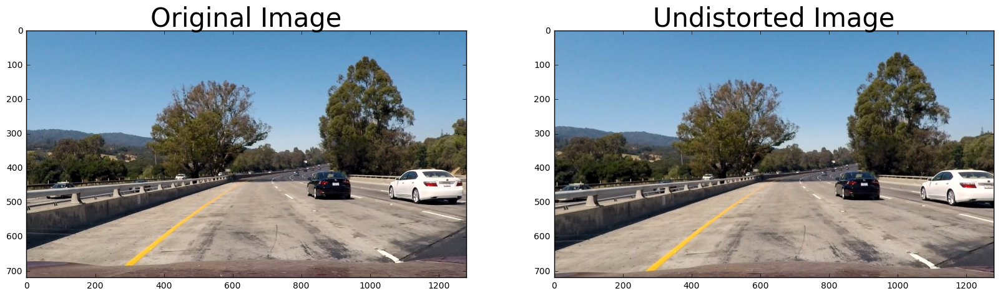

In [6]:
# Apply transformation to original image
images=[mpimg.imread(img) for img in ["test_images/test%d.jpg"%i for i in range(1,7)]]
image=images[0]
image_size=image.shape[:2][::-1]
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, image_size,None,None)
dst = cv2.undistort(image, mtx, dist, None, mtx)
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(dst)
ax2.set_title('Undistorted Image', fontsize=30)

## Stage 2: Color and Gradient

The color selection will only consider the S channel in HLS color space.

The gradient selection will only consider the partial derivative according to x axis.

First, adjust the parameters of color threshold and gradient threshold.

Then transform the image into binary image using the thresholds tuned above.

In [7]:
img=images[0]

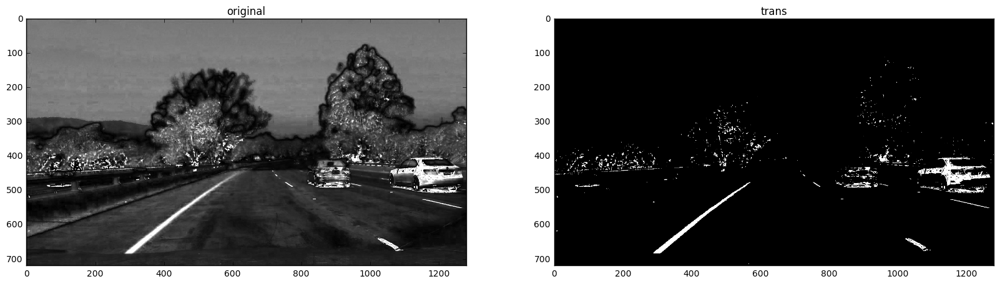

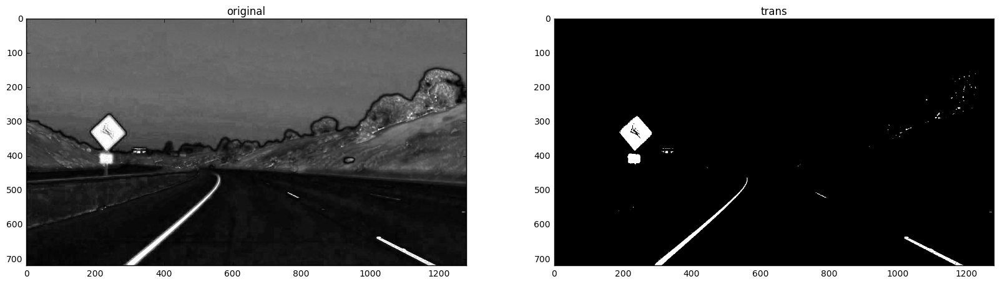

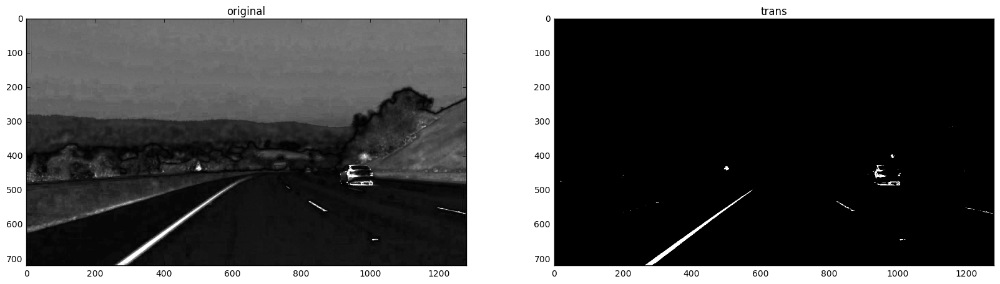

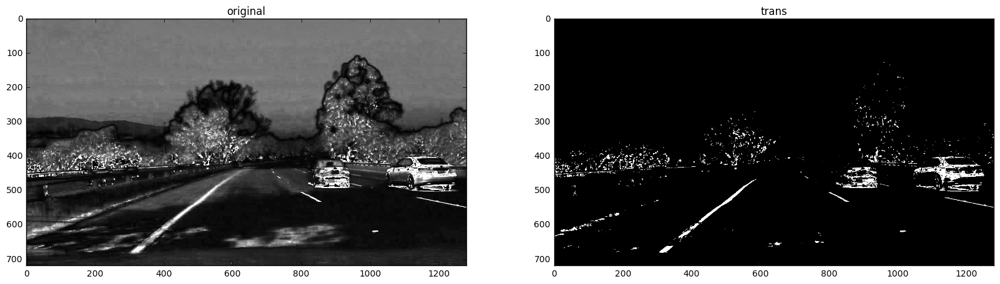

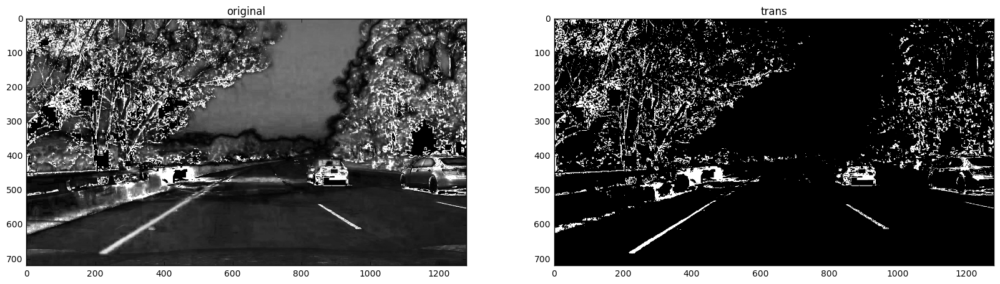

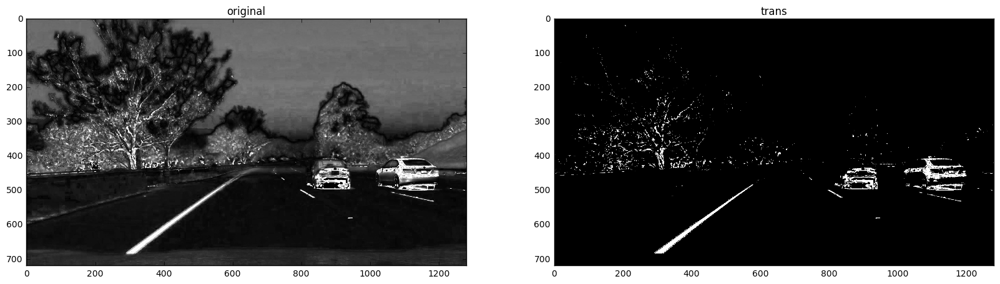

In [10]:
# Tune the parameters of color threshold

cmin,cmax=180,255
for img in images:
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= cmin) & (s_channel <= cmax)] = 1
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.set_title('original')
    ax1.imshow(s_channel,cmap="gray")

    ax2.set_title('trans')
    ax2.imshow(s_binary, cmap='gray')

plt.show()

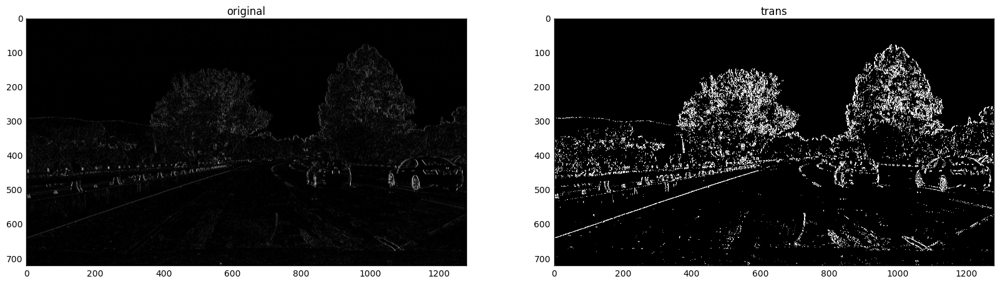

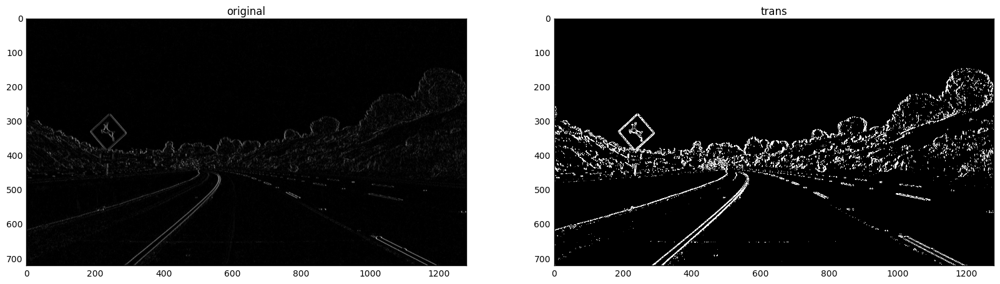

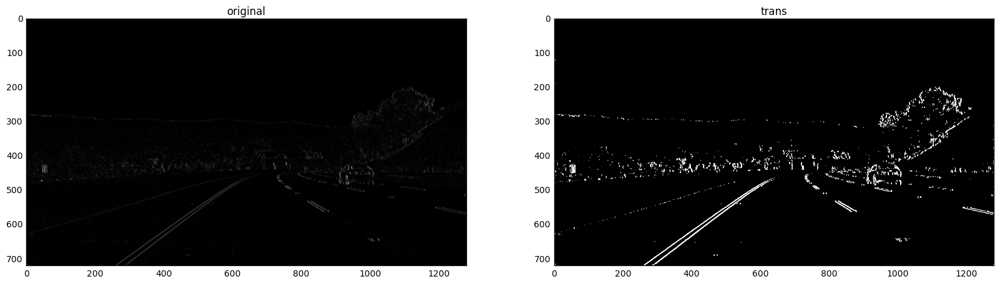

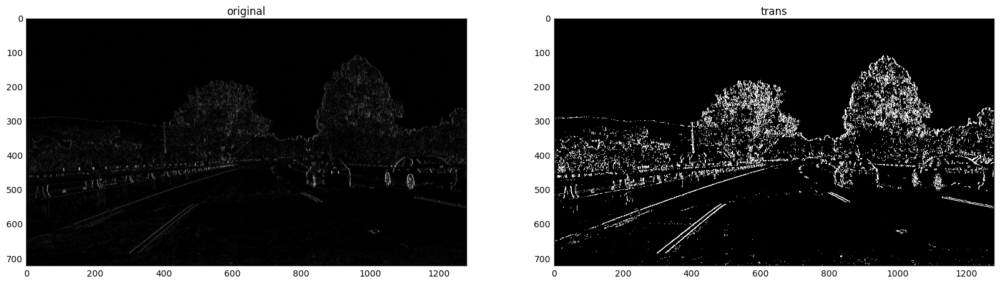

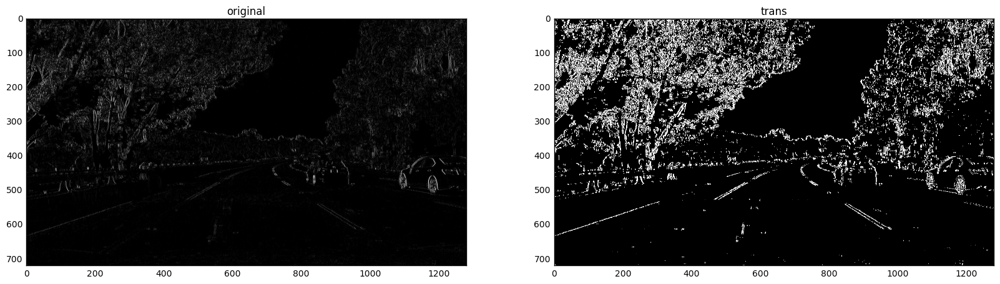

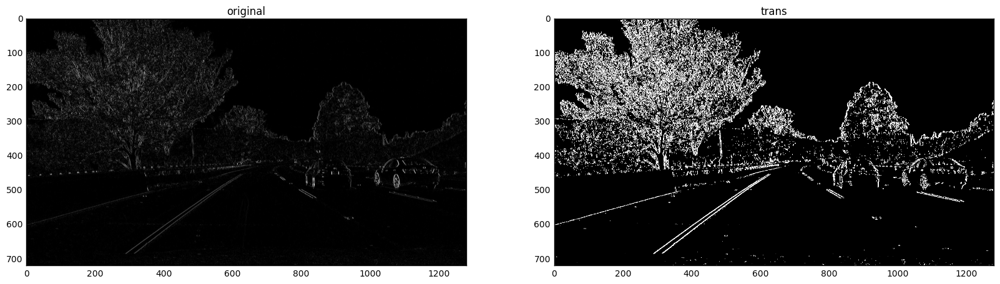

In [78]:
# Tune the parameters of gradient threshold

# Grayscale image
    # NOTE: we already saw that standard grayscaling lost color information for the lane lines
    # Explore gradients in other colors spaces / color channels to see what might work better

tmin,tmax=20,100
for img in images:
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    # Sobel x
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))

    # Threshold x gradient
    
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= tmin) & (scaled_sobel <= tmax)] = 1
    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.set_title('original')
    ax1.imshow(scaled_sobel,cmap="gray")

    ax2.set_title('trans')
    ax2.imshow(sxbinary, cmap='gray')

    plt.show()

In [8]:
# Color&Gradient Transformation
def colorAndGradient(img,params,plot=False):
    # Parameters: gmin,gmax,cmin,cmax
    thresh_min = params[0]
    thresh_max = params[1]
    s_thresh_min = params[2]
    s_thresh_max = params[3]
    
    
    # Convert to HLS color space and separate the S channel
    # Note: img is the undistorted image
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]

    # Grayscale image
    # NOTE: we already saw that standard grayscaling lost color information for the lane lines
    # Explore gradients in other colors spaces / color channels to see what might work better
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    # Sobel x
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))

    # Threshold x gradient
    
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1

    # Threshold color channel
    
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh_min) & (s_channel <= s_thresh_max)] = 1

    # Stack each channel to view their individual contributions in green and blue respectively
    # This returns a stack of the two binary images, whose components you can see as different colors
    color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary))

    # Combine the two binary thresholds
    combined_binary = np.zeros_like(sxbinary)
    combined_binary[(s_binary == 1) | (sxbinary == 1)] = 1

    if plot:
        # Plotting thresholded images
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
        ax1.set_title('Stacked thresholds')
        ax1.imshow(color_binary)

        ax2.set_title('Combined S channel and gradient thresholds')
        ax2.imshow(combined_binary, cmap='gray')
    return combined_binary

In [9]:
# the calibrated test image is then transformed
cag=colorAndGradient(dst,[70,150,170,255])

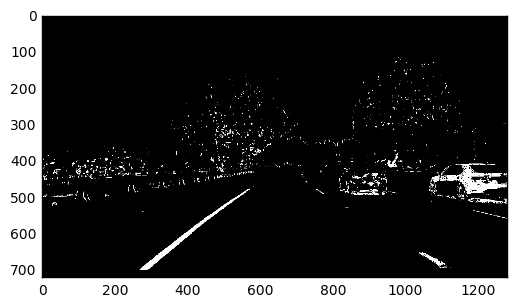

In [10]:
plt.imshow(cag,cmap="gray")

## Stage 3: Perspective Transformation

How to get the points?

By just trying maybe...

Or use the perspective transforming algorithms that mentioned in class.

However, I hard-coded them all this time using the linear functions.

I assume that the perspective goes to the center(640,360) of the image.


Picking the src and dst points is hard by hand-crafting.

There must be better methods however I still use hand-crafting this time.

First, I assume that the perspective all goes to the center.

Then, I use 3 parameters: LeftX(x1), RightX(x2), and the height.

Which would select out a tripzium region which left and right line have the same gradient and all pointing to the center of the image.

The height cut the triangle to the tripzium.

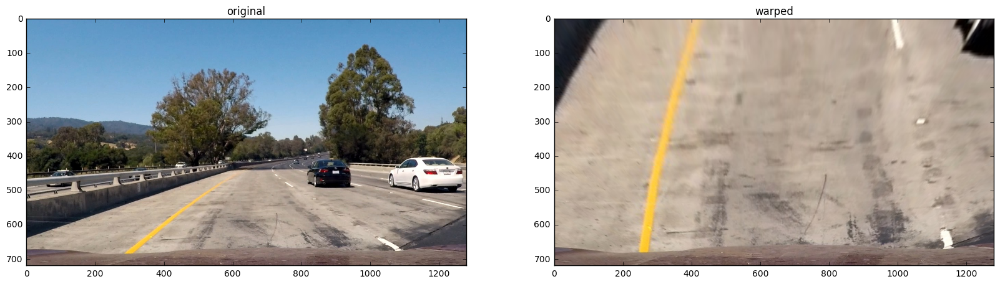

In [11]:
# Birdview Transformation 
params_p=[200,1200,240] # x1,x2 and h
x1=params_p[0]
x2=params_p[1]
h=params_p[2]
m1=360.0/(640-x1)
m2=360.0/(640-x2)
dx1=h/m1
dx2=h/m2

src=np.float32([
    [x1,720],
    [x1+dx1,720-h],
    [x2+dx2,720-h],
    [x2,720]
])
dst=np.float32([
    [x1,720],
    [x1,0],
    [x2,0],
    [x2,720]
    ])


M = cv2.getPerspectiveTransform(src, dst)
warped = cv2.warpPerspective(image, M, image_size, flags=cv2.INTER_LINEAR)
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.set_title('original')
ax1.imshow(image)

ax2.set_title('warped')
ax2.imshow(warped)


Oh, much better but not perfect.

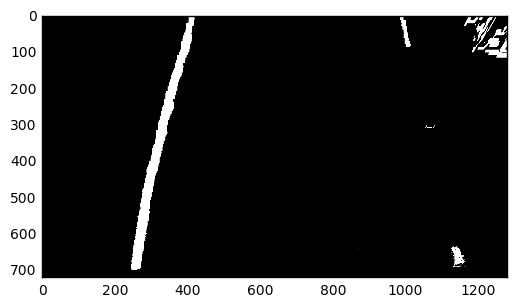

In [12]:
warped = cv2.warpPerspective(cag, M, image_size, flags=cv2.INTER_LINEAR)
plt.imshow(warped,cmap="gray")

Shadow and vehicle detected as noice, out of my expectation, hope it won't affect the future works.

I have tried plenty of parameter tuning and still failed to eliminate the shadow and vehicle.

In [13]:
def gaussian_blur(img, kernel_size):
    """Applies a Gaussian Noise kernel"""
    return cv2.GaussianBlur(img, (kernel_size, kernel_size), 0)

def region_of_interest(img, vertices):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)
    vertices=np.int32([vertices])
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image


def weighted_img(img, initial_img, α=0.8, β=1., λ=0.):
    """
    `img` is the output of the hough_lines(), An image with lines drawn on it.
    Should be a blank image (all black) with lines drawn on it.
    
    `initial_img` should be the image before any processing.
    
    The result image is computed as follows:
    
    initial_img * α + img * β + λ
    NOTE: initial_img and img must be the same shape!
    """
    return cv2.addWeighted(initial_img, α, img, β, λ)

# Color&Gradient Transformation
def colorAndGradient(img,params):
    '''
    may need some changes according to the course
    '''
    # Parameters: gmin,gmax,cmin,cmax
    thresh_min = params[0]
    thresh_max = params[1]
    s_thresh_min = params[2]
    s_thresh_max = params[3]
    
    
    # Convert to HLS color space and separate the S channel
    # Note: img is the undistorted image
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]

    # Grayscale image
    # NOTE: we already saw that standard grayscaling lost color information for the lane lines
    # Explore gradients in other colors spaces / color channels to see what might work better
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    # Sobel x
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))

    # Threshold x gradient
    
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1

    # Threshold color channel
    
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh_min) & (s_channel <= s_thresh_max)] = 1

    # Stack each channel to view their individual contributions in green and blue respectively
    # This returns a stack of the two binary images, whose components you can see as different colors
    color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary))

    # Combine the two binary thresholds
    combined_binary = np.zeros_like(sxbinary)
    combined_binary[(s_binary == 1) | (sxbinary == 1)] = 1

    return combined_binary


def perspective(img,params_p,plot=False):
    x1=params_p[0]
    x2=params_p[1]
    h=params_p[2]
    m1=360.0/(640-x1)
    m2=360.0/(640-x2)
    dx1=h/m1
    dx2=h/m2
    
    src=np.float32([
        [x1,720],
        [x1+dx1,720-h],
        [x2+dx2,720-h],
        [x2,720]
    ])
    dst=np.float32([
        [x1,720],
        [x1,0],
        [x2,0],
        [x2,720]
        ])
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst,src)
    img=region_of_interest(img,src) # select the region to filter the noise
    warped = cv2.warpPerspective(img, M, img.shape[:2][::-1], flags=cv2.INTER_LINEAR)
    
    if plot:
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
        ax1.set_title('original')
        ax1.imshow(img)

        ax2.set_title('warped')
        ax2.imshow(warped,cmap="gray")
        plt.show()
        
    return warped,Minv #return the minv for the warping back

In [15]:
params={
    "cg":[50,120,160,255], # color and gradient
    "p":[200,1200,250], # perspective
}

In [19]:
# Summary of first 3 stages
def transform(img,plot=False):
    global mtx,dist,params
    dst = cv2.undistort(img, mtx, dist, None, mtx)
    gaus = gaussian_blur(dst,5)
    cag = colorAndGradient(gaus,params["cg"])
    
    warped,Minv = perspective(cag,params["p"])
    
    if plot:
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
        ax1.set_title('original')
        ax1.imshow(img)

        ax2.set_title('warped')
        ax2.imshow(warped,cmap="gray")
        plt.show()
        
    return warped,Minv #return the minv for the warping back

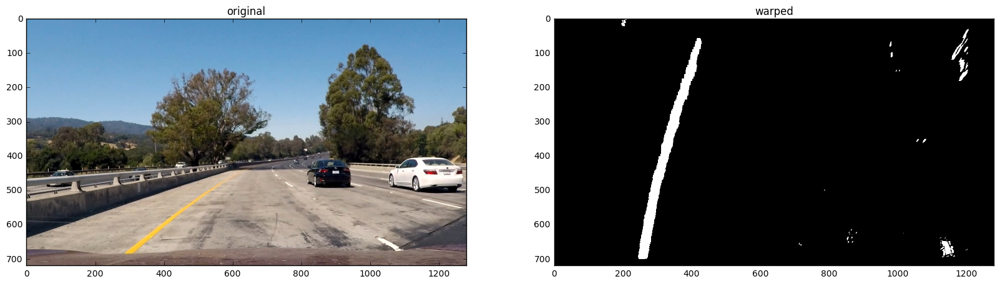

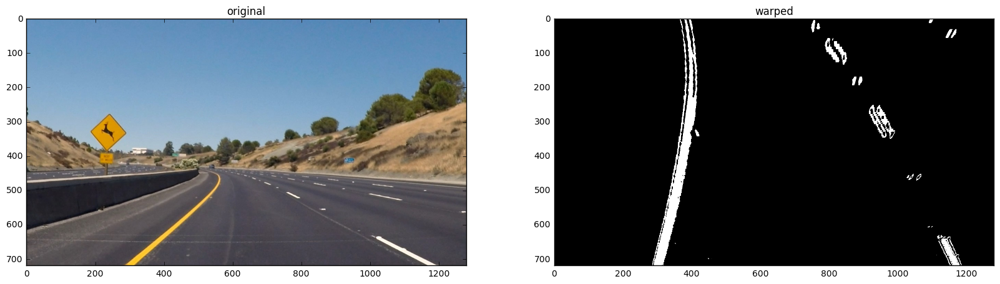

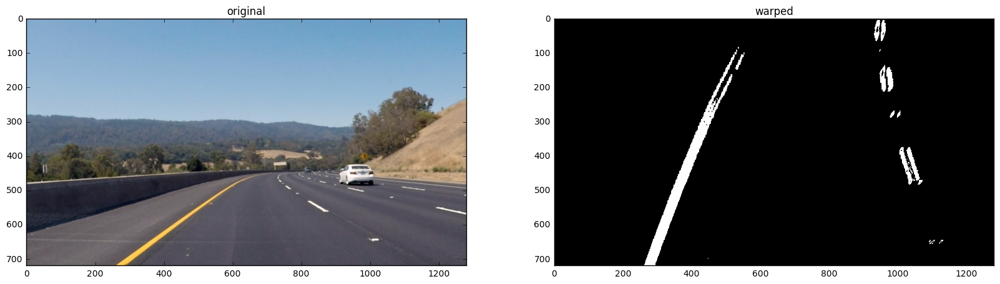

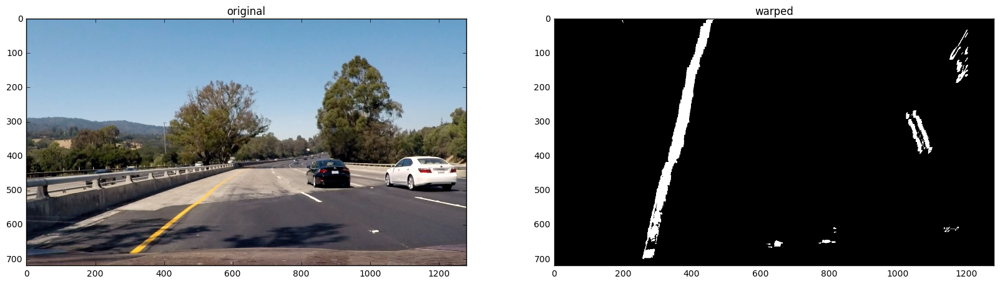

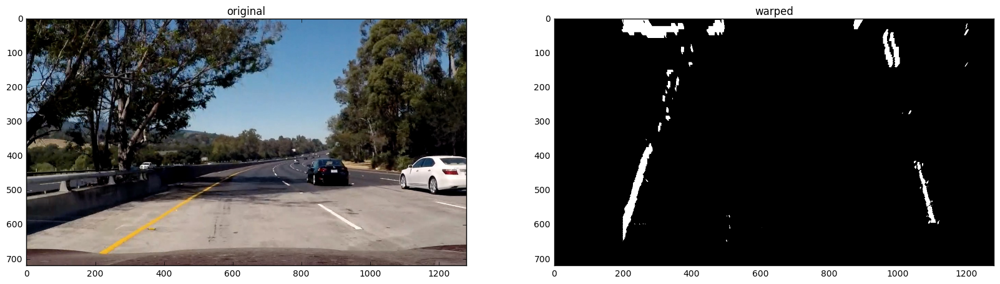

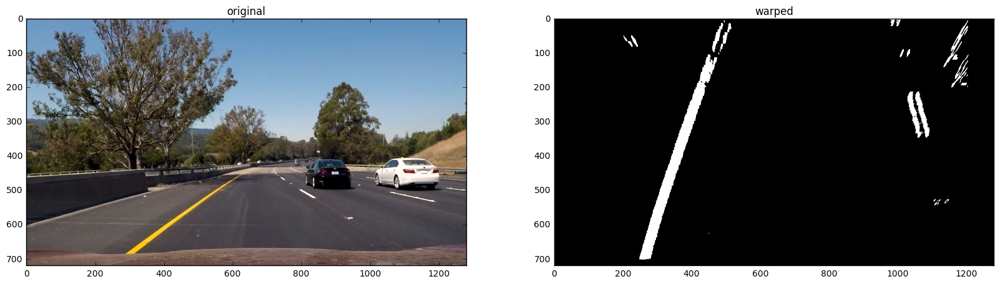

In [20]:
for img in images:
    transform(img,True)

When low threshold of gradient detection increases, the shadows are disppeard.

However, the performances on image 4 and 5 are not good because of noises.

## Stage 4: Detect curvature and vehicle position

What about maximize the measurement of fitness(such as person R^2) by adjust the parameters? That might be a good idea but requires plenty of work I guess.
And plenty of execution time, which is not good for self-driving car.

In [21]:
image,Minv=transform(images[1])

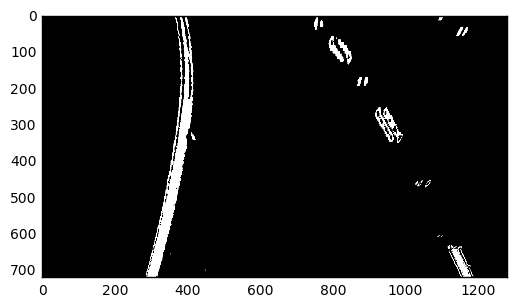

In [22]:
plt.imshow(image,cmap="gray")

In [23]:
# The line data structure
class Line(object):
    def __init__(self):
        ''' initialization
            needs further edition when the function come more complex
        '''
        self.left_fit=[]
        self.right_fit=[]
        self.left_fitx=[]
        self.right_fitx=[]
        self.leftx=[]
        self.lefty=[]
        self.left_fitc=[]
        self.right_fitc=[]
        self.left_curverad=0.
        self.right_curverad=0.
        self.center_position=0.

In [35]:
# TODO: implement sliding windows
def sliding_windows(binary_warped):
    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]/2:,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    line = Line()
    line.leftx = nonzerox[left_lane_inds]
    line.lefty = nonzeroy[left_lane_inds] 
    line.rightx = nonzerox[right_lane_inds]
    line.righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    line.left_fit = np.polyfit(line.lefty, line.leftx, 2)
    line.right_fit = np.polyfit(line.righty, line.rightx, 2)
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    line.left_fitx = line.left_fit[0]*ploty**2 + line.left_fit[1]*ploty + line.left_fit[2]
    line.right_fitx = line.right_fit[0]*ploty**2 + line.right_fit[1]*ploty + line.right_fit[2]
    
    
    return line

In [26]:
# TODO: implement region filtering
def line_fitting(binary_warped, lastline):
    # Assume you now have a new warped binary image 
    # from the next frame of video (also called "binary_warped")
    # It's now much easier to find line pixels!
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 100
    left_fit = lastline.left_fit
    right_fit = lastline.right_fit
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin))) 
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))  

    # Again, extract left and right line pixel positions
    line = Line()
    line.leftx = nonzerox[left_lane_inds]
    line.lefty = nonzeroy[left_lane_inds] 
    line.rightx = nonzerox[right_lane_inds]
    line.righty = nonzeroy[right_lane_inds]
    # Fit a second order polynomial to each
    line.left_fit = np.polyfit(line.lefty, line.leftx, 2)
    line.right_fit = np.polyfit(line.righty, line.rightx, 2)
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    line.left_fitx = line.left_fit[0]*ploty**2 + line.left_fit[1]*ploty + line.left_fit[2]
    line.right_fitx = line.right_fit[0]*ploty**2 + line.right_fit[1]*ploty + line.right_fit[2]
    return line

In [32]:
# Curverad Calc.

def get_curverad(line,img):
    # Define conversions in x and y from pixels space to meters
    nvals = len(line.left_fitx)
    yvals = np.linspace(0,img.shape[0],img.shape[0])
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meteres per pixel in x dimension
    y_eval = np.max(yvals)

    line.left_fitc = np.polyfit(line.lefty*ym_per_pix, line.leftx*xm_per_pix, 2)
    line.right_fitc = np.polyfit(line.righty*ym_per_pix, line.rightx*xm_per_pix, 2)
    
    # Calc the curverad
    line.left_curverad = ((1 + (2*line.left_fitc[0]*y_eval + line.left_fitc[1])**2)**1.5) \
                                 /np.absolute(2*line.left_fitc[0])
    line.right_curverad = ((1 + (2*line.right_fitc[0]*y_eval + line.right_fitc[1])**2)**1.5) \
                                    /np.absolute(2*line.right_fitc[0])
    # Now our radius of curvature is in meters

In [28]:
# get center position
def get_center_position(line,img):
    xm_per_pix = 3.7/700 # meteres per pixel in x dimension
    line.center_position = (((line.left_fitx[-1]+line.right_fitx[-1]) / 2.) 
                            - img.shape[1] / 2) * xm_per_pix
    

In [36]:
# test the sliding windows
test_line = sliding_windows(image)
get_curverad(test_line,image)
get_center_position(test_line,image)
test_line.left_curverad, test_line.right_curverad, test_line.center_position

/Users/jhsiao/anaconda/envs/py3/lib/python3.5/site-packages/ipykernel/__main__.py:5: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


(2361.7196385203811, 1784.228474612805, 0.48034669280362813)

In [37]:
# test the fitting
test_line = line_fitting(image,test_line)
get_curverad(test_line,image)
get_center_position(test_line,image)
test_line.left_curverad, test_line.right_curverad, test_line.center_position

(2380.6297045432862, 1771.3486785371724, 0.47941777446963052)

In [39]:
# line finding pipeline:
def line_finding(binary_warped,lastline):
    if lastline==0: # if this is the first frame
        line = sliding_windows(binary_warped)
        get_curverad(line,binary_warped)
        get_center_position(line,binary_warped)
    else:
        line = line_fitting(binary_warped,lastline)
        get_curverad(line,binary_warped)
        get_center_position(line,binary_warped)
    return line
    

## Stage 5: Warp back onto the original image

Draw lane line region on the original image.

And then put text about the curverad on it.


In [40]:
# warping back
def warp_back(img,line,Minv):
    yvals=np.linspace(0,img.shape[0],img.shape[0])
    # Create an image to draw the lines on
    color_warp = np.zeros_like(img).astype(np.uint8)
    # color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([line.left_fitx, yvals]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([line.right_fitx, yvals])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (image.shape[1], image.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(img, 1, newwarp, 0.3, 0)
    thickn=5
    cv2.putText(result, "Left Curverad: %d m"%line.left_curverad, (50,100),cv2.FONT_HERSHEY_SIMPLEX,2,(255,255,255),thickness=thickn)
    cv2.putText(result, "Right Curverad: %d m"%line.right_curverad, (50,200),cv2.FONT_HERSHEY_SIMPLEX,2,(255,255,255),thickness=thickn)
    return result 
    

In [41]:
params={
    "cg":[50,120,160,255], # color and gradient, when
    "p":[200,1200,250], #perspective transformation
}

In [42]:
# global var:lastline
LASTLINE=0

In [49]:
# pipeline:processing image
def process_image(img):
    global LASTLINE
    warped,Minv=transform(img)
    line=line_finding(warped,LASTLINE)
    LASTLINE=line
    return warp_back(img,line,Minv)

## Stage 6: Test On Videos

In [44]:
# Video Generation Phase
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [45]:
trial_i=100 # change it every time as new video is outputed
#0 5 100

In [ ]:
# Video Generation
LASTLINE=0
trial_i+=1
video_output = 'trial_%d.mp4'%trial_i
clip1 = VideoFileClip("project_video.mp4")
white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time white_clip.write_videofile(video_output, audio=False)

[MoviePy] >>>> Building video trial_104.mp4
[MoviePy] Writing video trial_104.mp4


 84%|████████▎ | 1055/1261 [01:54<00:24,  8.34it/s]

In [3]:
# Video Play
video_output="trial_104.mp4"
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(video_output))

I think the performance in video is not that good.

Plenty of noises influnce the performance of line tracking.

And no smoothing technique is used, the values of curverad go up and down frequently.


## Stage 7: Reflection

This is my first try of this challenging task.

I think there are several facts to be improved.

First, the noises, such as vehicles, other lane lines and shawdows, is very hard to be filtered. I should choose a better filtering algorithm to get the lane lines out only.

Second, the peak finding, and the polynomial fit, are bad engineered this time. I fit the curve directly without any noise filtering algorithm like sliding windows. Noise unfiltered is one important aspect. So do the algorithm chosen to plot the pixels on fitting space is not robust. I should try other methods on those issues.

Then, I do not know how to detect the vehicle position according to lane lines.